# Artificial Neural Networks and Deep Learning

---

## Homework 1: Minimal Working Example

To make your first submission, follow these steps:
1. Create a folder named `[2024-2025] AN2DL/Homework 1` in your Google Drive.
2. Upload the `training_set.npz` file to this folder.
3. Upload the Jupyter notebook `Homework 1 - Minimal Working Example.ipynb`.
4. Load and process the data.
5. Implement and train your model.
6. Submit the generated `.zip` file to Codabench.


## 🌐 Connect Colab to Google Drive

In [ ]:
from google.colab import drive

drive.mount('/gdrive')
%cd /gdrive/My Drive/[2024-2025] AN2DL/Homework 1

Mounted at /gdrive
/gdrive/My Drive/[2024-2025] AN2DL/Homework 1


## ⚙️ Import Libraries

In [ ]:
# Set seed for reproducibility
seed = 42

import numpy as np

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

np.random.seed(seed)
tf.random.set_seed(seed);

In [ ]:
# Import other necessary libraries
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random

# Set seeds for random number generators in Python
random.seed(seed)

# Set seed for TensorFlow
tf.compat.v1.set_random_seed(seed)

# Reduce TensorFlow verbosity
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# Print TensorFlow version
print(tf.__version__)

# Import other libraries (and some more libraries for image manipulation)
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
from PIL import Image
import matplotlib.gridspec as gridspec

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

2.17.0


## ⏳ Load the Data

In [ ]:
data = np.load('training_set.npz')  # Load the training data here
X = data['images']
y = data['labels']

In [ ]:
labels = {
    0: 'Basophil',
    1: 'Eosinophil',
    2: ' Erythroblast',
    3: 'Immature granulocytes',
    4: 'Lymphocyte',
    5: 'Monocyte',
    6: 'Neutrophil',
    7: 'Platelet'
}

unique_labels = list(labels.values())

print('Labels:\n', unique_labels)

Labels:
 ['Basophil', 'Eosinophil', ' Erythroblast', 'Immature granulocytes', 'Lymphocyte', 'Monocyte', 'Neutrophil', 'Platelet']
7


In [ ]:
# Define a function to display images
def display_images(
    X=X,
    y=y,
    labels=unique_labels,
    num_images=8
):
    random_indices = random.sample(range(len(X)), num_images)

    fig, axes = plt.subplots(2, num_images // 2, figsize=(20, 9))

    for i, idx in enumerate(random_indices):
        ax = axes[i // 4, i % 4]
        ax.imshow(X[idx])

        class_name = unique_labels[y[idx][0]]
        ax.set_title(class_name, pad=5)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

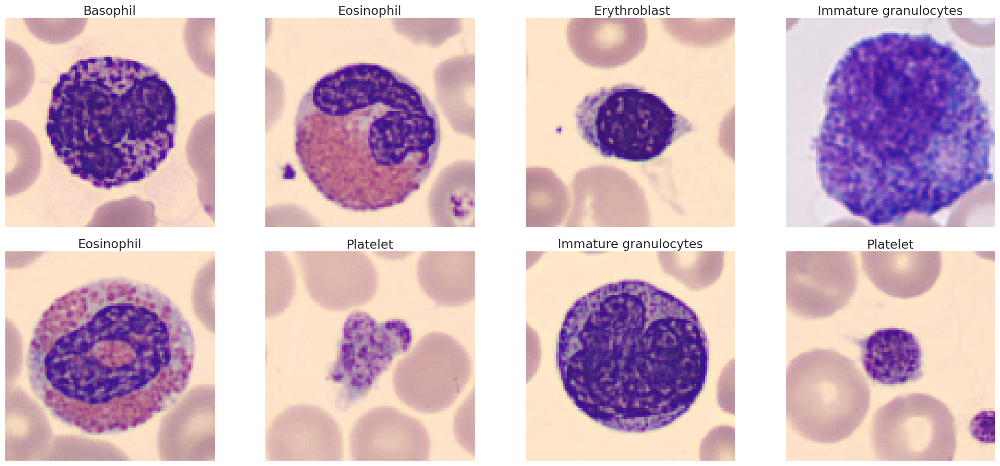

In [ ]:
display_images(X, y)

<class 'numpy.ndarray'>
(13759, 96, 96, 3)
4
Class: [7]


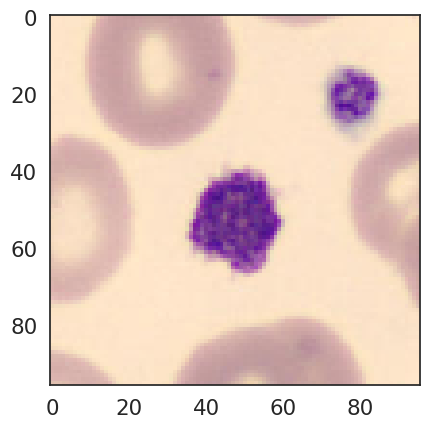

In [ ]:
print(type(X))
print(X.shape)
print(X.ndim)
print(f'Class: {y[0]}')
plt.imshow(X[0])

## Inspect Data

In [ ]:
print(f'Dataset Shape: {X.shape}')
print(f'Labels Shape: {y.shape}')

Dataset Shape: (13759, 96, 96, 3)
Labels Shape: (13759, 1)


In [ ]:
print('Counting occurences of target classes:')
print(pd.DataFrame(y, columns=['digit'])['digit'].value_counts())

Counting occurences of target classes:
digit
6    2530
1    2381
3    2226
7    1843
5    1393
2    1285
0    1052
4    1049
Name: count, dtype: int64


[5]


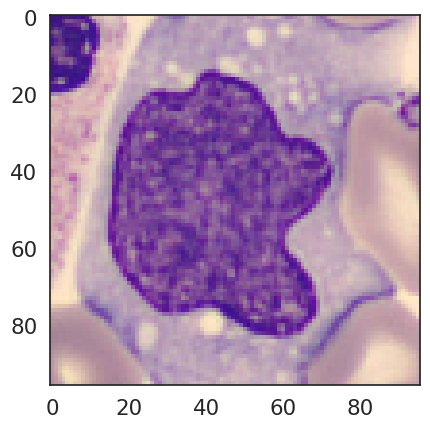

In [ ]:
plt.imshow(X[3025])
print(y[3025])

## Process Data

(11953,)
Dataset (no duplicates) Shape: (11943, 96, 96, 3)
Dataset (no duplicates) Shape: (11943, 1)
[5]


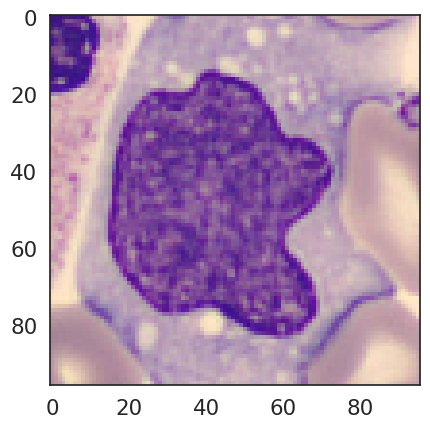

In [ ]:
# Eliminate duplicates
X_unique, idx, count = np.unique(X, return_index=True, return_counts=True, axis=0)
print(idx.shape)

index = [idx[i] for i in range(idx.shape[0]) if count[i] == 1]

X = X[index]
y = y[index]

print(f'Dataset (no duplicates) Shape: {X.shape}')
print(f'Dataset (no duplicates) Shape: {y.shape}')

plt.imshow(X[1])
print(y[1])

In [ ]:
print('Counting occurences of target classes:')
print(pd.DataFrame(y, columns=['digit'])['digit'].value_counts())

Counting occurences of target classes:
digit
6    2330
1    2177
3    2020
7    1643
2    1085
5     991
4     849
0     848
Name: count, dtype: int64


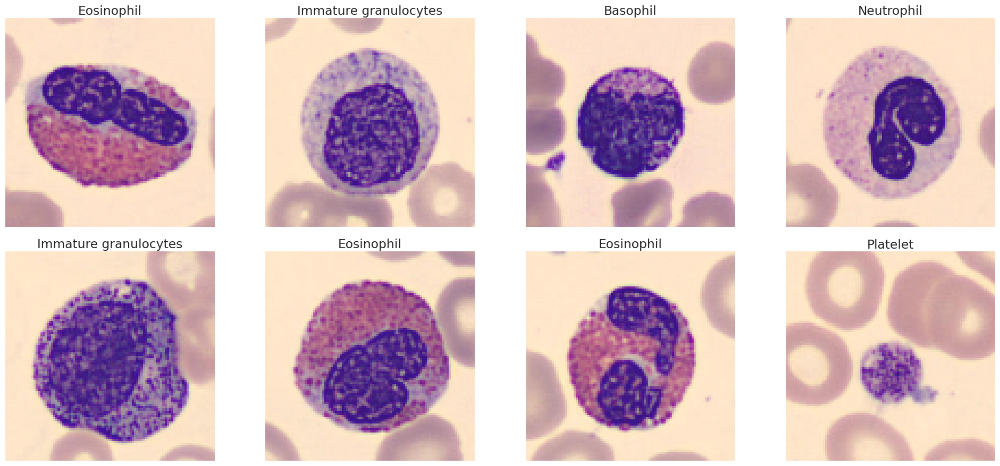

In [ ]:
display_images(X, y)

In [ ]:
# Convert labels to categorical format using one-hot encoding
y = tfk.utils.to_categorical(y)

In [ ]:
# Split the  dataset into training set, validation set, and test set

# Get training-validation set and test set
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X,
    y,
    random_state=seed,
    test_size=0.1,
    stratify=y)

# Get training set and validation set
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val,
    y_train_val,
    random_state=seed,
    test_size=len(y_test),
    stratify=y_train_val)

print(f'Training Set Shape: {X_train.shape}')
print(f'Training Labels Shape: {y_train.shape}\n')

print(f'Validation Set Shape: {X_val.shape}')
print(f'Validation Labels Shape: {y_val.shape}\n')

print(f'Test Set Shape: {X_test.shape}')
print(f'Test Labels Shape: {y_test.shape}')

Training Set Shape: (9553, 96, 96, 3)
Training Labels Shape: (9553, 8)

Validation Set Shape: (1195, 96, 96, 3)
Validation Labels Shape: (1195, 8)

Test Set Shape: (1195, 96, 96, 3)
Test Labels Shape: (1195, 8)


In [ ]:
# Compare categorical label and "default" label representation

# Display the categorical label
print(f'Categorical Label: {y_train[0]}')
# Display the equivalent numeric label
print(f'"Default" Label: {np.argmax(y_train[0])}')

Categorical Label: [0. 1. 0. 0. 0. 0. 0. 0.]
"Default" Label: 1


## Define Model Parameters

In [ ]:
input_shape = X.shape[1:]
output_shape = y.shape[-1]

print(f'Input Shape: {input_shape}')
print(f'Output Shape: {output_shape}')

Input Shape: (96, 96, 3)
Output Shape: 8


In [ ]:
# Number of epochs
epochs = 150

# Batch Size
batch_size = 128

# Learning Rate
learning_rate = 0.001

print(f'Number of epochs: {epochs}')
print(f'Batch Size: {batch_size}')
print(f'Learning Rate: {learning_rate}')

Number of epochs: 150
Batch Size: 128
Learning Rate: 0.001


## Transfer Learning

Model: "MobileNetV3Small"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 96, 96, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_2 (Rescaling)   │ (None, 96, 96, 3)      │              0 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv (Conv2D)             │ (None, 48, 48, 16)     │            432 │ rescaling_2[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_bn                   │ (None, 48, 48, 16)     │             64 │ conv[0][0]             │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_36             │ (None, 48, 48, 16)     │              0 │ conv_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 49, 49, 16)     │              0 │ activation_36[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 24, 24, 16)     │            144 │ expanded_conv_depthwi… │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 24, 24, 16)     │             64 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_28 (ReLU)           │ (None, 24, 24, 16)     │              0 │ expanded_conv_depthwi… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 16)       │              0 │ re_lu_28[0][0]         │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 8)        │            136 │ expanded_conv_squeeze… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 8)        │              0 │ expanded_conv_squeeze… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_squeeze_ex… │ (None, 1, 1, 16)       │            144 │ expanded_conv_squeeze… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_18 (Add)              │ (None, 1, 1, 16)       │              0 │ expanded_conv_squeeze… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_29 (ReLU)      

 Total params: 939,120 (3.58 MB)

 Trainable params: 927,008 (3.54 MB)

 Non-trainable params: 12,112 (47.31 KB)

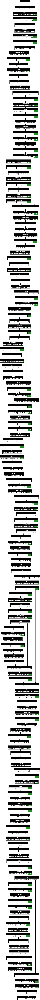

In [ ]:
mobilenet = tfk.applications.MobileNetV3Small(
    input_shape=input_shape,
    include_top=False,
    weights='imagenet',
    pooling='max',
    include_preprocessing=True
)

mobilenet.summary(expand_nested=True)

tfk.utils.plot_model(mobilenet, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_5 (RandomFlip)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_rotation_4               │ (None, 96, 96, 3)           │               0 │
│ (RandomRotation)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_zoom_4 (RandomZoom)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 576)                 │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_5 (InputLayer)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_2 (Rescaling)         │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv (Conv2D)                   │ (None, 48, 48, 16)          │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_bn (BatchNormalization)    │ (None, 48, 48, 16)          │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ activation_36 (Activation)      │ (None, 48, 48, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_pad     │ (None, 49, 49, 16)          │               0 │
│ (ZeroPadding2D)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise         │ (None, 24, 24, 16)          │             144 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_bn      │ (None, 24, 24, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ re_lu_28 (ReLU)                 │ (None, 24, 24, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 16)            │               0 │
│ expanded_conv_squeeze_excite_avg_po… │                             │                 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │             136 │
│ expanded_conv_squeeze_excite_conv    │                             │                 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 1,238,648 (4.73 MB)

 Trainable params: 299,528 (1.14 MB)

 Non-trainable params: 939,120 (3.58 MB)

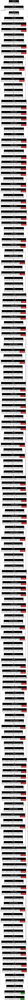

In [ ]:
# Freeze all layers in MobileNetV3
mobilenet.trainable = False

# Create the input layer
inputs = tfk.Input(shape=input_shape, name='input_layer')

# Data augmentation
augmentation = tf.keras.Sequential(
    [tfkl.RandomFlip("horizontal_and_vertical"),
     tfkl.RandomRotation(factor=0.2, fill_mode='nearest'),
     tfkl.RandomZoom(height_factor=0.2, fill_mode='nearest')
     #tfkl.RandomBrightness(factor=0.1, value_range=(0,1)),
     #tfkl.RandomContrast(factor=0.1)
     ],
    name = 'preprocessing'
)

x = augmentation(inputs)

# Pass augmented inputs to MobileNetV3Small architecture (used as a feature extractor only)
x = mobilenet(x)

# Add a Dropout Layer for Regularization
x = tfkl.Dropout(0.25, name='dropout')(x)

x = tfkl.Dense(units=512, activation='relu', name='dense1')(x)
#x = tfkl.Dense(units=512, activation='relu', name='dense2')(x)
#x = tfkl.Dense(units=512, activation='relu', name='dense3')(x)
#x = tfkl.Dense(units=512, activation='relu', name='dense4')(x)
#x = tfkl.Dense(units=512, activation='relu', name='dense5')(x)

outputs = tfkl.Dense(units=output_shape, activation='softmax', name='output_layer')(x)

model = tfk.Model(
    inputs=inputs,
    outputs=outputs,
    name='model')

model.compile(
    loss=tfk.losses.CategoricalCrossentropy(),
    optimizer=tfk.optimizers.Adam(learning_rate),
    metrics=['accuracy']
)

model.summary(expand_nested=True)

tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

## Define Early Stopping Callback

In [ ]:
patience = 20

early_stopping = tfk.callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=patience,
    restore_best_weights=True
)

callbacks = [early_stopping]

## 🛠️ Train and Save the Model

In [ ]:
history = model.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    callbacks=callbacks
).history

# Compute and print the final validation accuracy
final_val_accuracy = round(max(history['val_accuracy'])*100, 2)
print(f'Final Validation Accuracy: {final_val_accuracy}')

model.save('weights.keras')
del model

Epoch 1/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 49s 574ms/step - accuracy: 0.5795 - loss: 2.1422 - val_accuracy: 0.8720 - val_loss: 0.3783
Epoch 2/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 79s 532ms/step - accuracy: 0.8111 - loss: 0.5748 - val_accuracy: 0.8904 - val_loss: 0.3057
Epoch 3/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 39s 519ms/step - accuracy: 0.8244 - loss: 0.4947 - val_accuracy: 0.9054 - val_loss: 0.2798
Epoch 4/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 41s 519ms/step - accuracy: 0.8452 - loss: 0.4505 - val_accuracy: 0.9054 - val_loss: 0.2701
Epoch 5/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 42s 531ms/step - accuracy: 0.8513 - loss: 0.4220 - val_accuracy: 0.9088 - val_loss: 0.2751
Epoch 6/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 40s 514ms/step - accuracy: 0.8575 - loss: 0.4025 - val_accuracy: 0.8870 - val_loss: 0.2997
Epoch 7/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 42s 531ms/step - accuracy: 0.8543 - loss: 0.4105 - val_accuracy: 0.9096 - val_loss: 0.2772
Epoch 8/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 40s 520ms/step - accuracy: 0.8648 - loss: 0.3815 - 

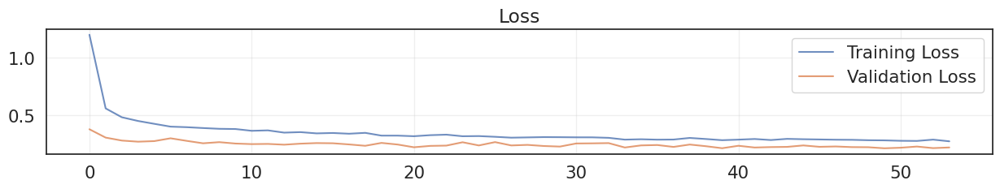

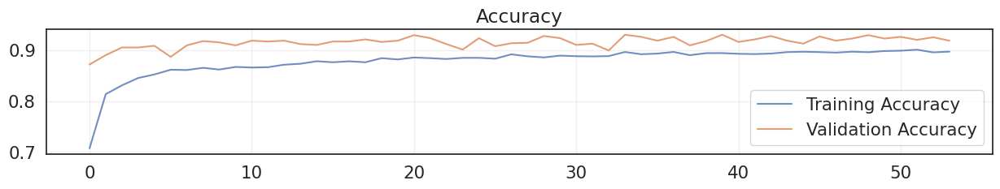

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training Loss', alpha=0.8)
plt.plot(history['val_loss'], label='Validation Loss', alpha=0.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=0.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training Accuracy', alpha=0.8)
plt.plot(history['val_accuracy'], label='Validation Accuracy', alpha=0.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=0.3)

plt.show()

## Fine Tuning

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_5 (RandomFlip)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_rotation_4               │ (None, 96, 96, 3)           │               0 │
│ (RandomRotation)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_zoom_4 (RandomZoom)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 576)                 │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_5 (InputLayer)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_2 (Rescaling)         │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv (Conv2D)                   │ (None, 48, 48, 16)          │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_bn (BatchNormalization)    │ (None, 48, 48, 16)          │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ activation_36 (Activation)      │ (None, 48, 48, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_pad     │ (None, 49, 49, 16)          │               0 │
│ (ZeroPadding2D)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise         │ (None, 24, 24, 16)          │             144 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_bn      │ (None, 24, 24, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ re_lu_28 (ReLU)                 │ (None, 24, 24, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 16)            │               0 │
│ expanded_conv_squeeze_excite_avg_po… │                             │                 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │             136 │
│ expanded_conv_squeeze_excite_conv    │                             │                 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 1,837,706 (7.01 MB)

 Trainable params: 299,528 (1.14 MB)

 Non-trainable params: 939,120 (3.58 MB)

 Optimizer params: 599,058 (2.29 MB)

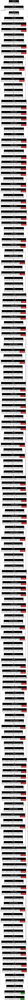

In [ ]:
# Load the model
model = tfk.models.load_model('weights.keras')

# Display a summary of the model architecture
model.summary(expand_nested=True)

# Plot the model architecture with trainable parameters and layer shapes
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Set teh MobileNetV3Small model layers as trainable
model.get_layer('MobileNetV3Small').trainable = True

# Set all MobileNetV3Small model layers as non-trainable
for layer in model.get_layer('MobileNetV3Small').layers:
    layer.trainable = False

# Enable training only fot Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(model.get_layer('MobileNetV3Small').layers):
  if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
      layer.trainable = True
      print(i, layer.name, type(layer).__name__, layer.trainable)

2 conv Conv2D True
6 expanded_conv_depthwise DepthwiseConv2D True
10 expanded_conv_squeeze_excite_conv Conv2D True
12 expanded_conv_squeeze_excite_conv_1 Conv2D True
15 expanded_conv_project Conv2D True
17 expanded_conv_1_expand Conv2D True
21 expanded_conv_1_depthwise DepthwiseConv2D True
24 expanded_conv_1_project Conv2D True
26 expanded_conv_2_expand Conv2D True
29 expanded_conv_2_depthwise DepthwiseConv2D True
32 expanded_conv_2_project Conv2D True
35 expanded_conv_3_expand Conv2D True
39 expanded_conv_3_depthwise DepthwiseConv2D True
43 expanded_conv_3_squeeze_excite_conv Conv2D True
45 expanded_conv_3_squeeze_excite_conv_1 Conv2D True
48 expanded_conv_3_project Conv2D True
50 expanded_conv_4_expand Conv2D True
53 expanded_conv_4_depthwise DepthwiseConv2D True
57 expanded_conv_4_squeeze_excite_conv Conv2D True
59 expanded_conv_4_squeeze_excite_conv_1 Conv2D True
62 expanded_conv_4_project Conv2D True
65 expanded_conv_5_expand Conv2D True
68 expanded_conv_5_depthwise DepthwiseConv2

0 input_layer_5 False
1 rescaling_2 False
2 conv False
3 conv_bn False
4 activation_36 False
5 expanded_conv_depthwise_pad False
6 expanded_conv_depthwise False
7 expanded_conv_depthwise_bn False
8 re_lu_28 False
9 expanded_conv_squeeze_excite_avg_pool False
10 expanded_conv_squeeze_excite_conv False
11 expanded_conv_squeeze_excite_relu False
12 expanded_conv_squeeze_excite_conv_1 False
13 re_lu_29 False
14 expanded_conv_squeeze_excite_mul False
15 expanded_conv_project False
16 expanded_conv_project_bn False
17 expanded_conv_1_expand False
18 expanded_conv_1_expand_bn False
19 re_lu_30 False
20 expanded_conv_1_depthwise_pad False
21 expanded_conv_1_depthwise False
22 expanded_conv_1_depthwise_bn False
23 re_lu_31 False
24 expanded_conv_1_project False
25 expanded_conv_1_project_bn False
26 expanded_conv_2_expand False
27 expanded_conv_2_expand_bn False
28 re_lu_32 False
29 expanded_conv_2_depthwise False
30 expanded_conv_2_depthwise_bn False
31 re_lu_33 False
32 expanded_conv_2_projec

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_5 (RandomFlip)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_rotation_4               │ (None, 96, 96, 3)           │               0 │
│ (RandomRotation)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_zoom_4 (RandomZoom)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 576)                 │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_5 (InputLayer)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_2 (Rescaling)         │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv (Conv2D)                   │ (None, 48, 48, 16)          │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_bn (BatchNormalization)    │ (None, 48, 48, 16)          │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ activation_36 (Activation)      │ (None, 48, 48, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_pad     │ (None, 49, 49, 16)          │               0 │
│ (ZeroPadding2D)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise         │ (None, 24, 24, 16)          │             144 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_bn      │ (None, 24, 24, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ re_lu_28 (ReLU)                 │ (None, 24, 24, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 16)            │               0 │
│ expanded_conv_squeeze_excite_avg_po… │                             │                 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │             136 │
│ expanded_conv_squeeze_excite_conv    │                             │                 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 1,837,706 (7.01 MB)

 Trainable params: 938,024 (3.58 MB)

 Non-trainable params: 300,624 (1.15 MB)

 Optimizer params: 599,058 (2.29 MB)

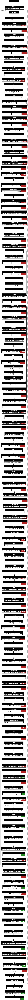

In [ ]:
# Set the number of layers to freeze
N = 124

# Set the first N layers as non-trainable
for i, layer in enumerate(model.get_layer('MobileNetV3Small').layers[:N]):
    layer.trainable = False

# Print layer indices, names, and trainability status
for i, layer in enumerate(model.get_layer('MobileNetV3Small').layers):
    print(i, layer.name, layer.trainable)

# Display a summary of the model architecture
model.summary(expand_nested=True)

# Display model architecture with trainable parameters and layer shapes
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Compile the model
model.compile(
    loss=tfk.losses.CategoricalCrossentropy(),
    optimizer=tfk.optimizers.Adam(1e-4),
    metrics=['accuracy']
)

In [ ]:
patience = 20

early_stopping = tfk.callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=patience,
    restore_best_weights=True
)

callbacks = [early_stopping]

In [ ]:
history = model.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    callbacks=callbacks
).history

# Compute and print the Final Validation Accuracy
final_val_accuracy = round(max(history['val_accuracy'])*100, 2)
print(f'Final Validation Accuracy: {final_val_accuracy}%')

model.save('weights.keras')

del model

Epoch 1/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 56s 615ms/step - accuracy: 0.9023 - loss: 0.2810 - val_accuracy: 0.9397 - val_loss: 0.1926
Epoch 2/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 45s 597ms/step - accuracy: 0.9171 - loss: 0.2253 - val_accuracy: 0.9297 - val_loss: 0.1959
Epoch 3/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 45s 596ms/step - accuracy: 0.9260 - loss: 0.2037 - val_accuracy: 0.9448 - val_loss: 0.1689
Epoch 4/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 83s 613ms/step - accuracy: 0.9285 - loss: 0.1974 - val_accuracy: 0.9347 - val_loss: 0.1773
Epoch 5/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 46s 620ms/step - accuracy: 0.9350 - loss: 0.1815 - val_accuracy: 0.9464 - val_loss: 0.1572
Epoch 6/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 82s 618ms/step - accuracy: 0.9336 - loss: 0.1774 - val_accuracy: 0.9423 - val_loss: 0.1675
Epoch 7/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 82s 617ms/step - accuracy: 0.9436 - loss: 0.1577 - val_accuracy: 0.9423 - val_loss: 0.1692
Epoch 8/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 81s 609ms/step - accuracy: 0.9448 - loss: 0.1543 - 

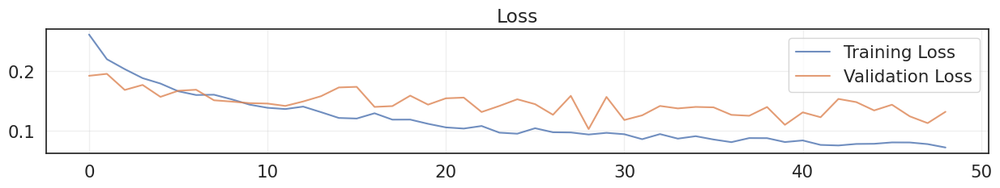

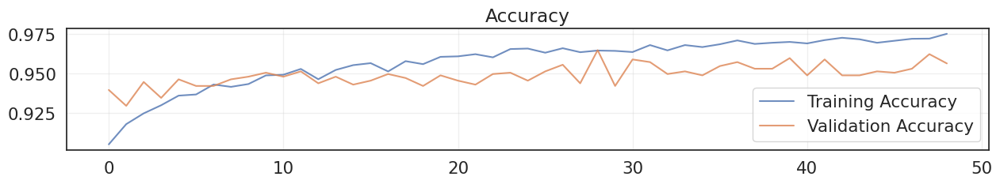

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training Loss', alpha=0.8)
plt.plot(history['val_loss'], label='Validation Loss', alpha=0.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=0.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training Accuracy', alpha=0.8)
plt.plot(history['val_accuracy'], label='Validation Accuracy', alpha=0.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=0.3)

plt.show()

## Use the Model - Make Inference

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ preprocessing (Sequential)           │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_flip_5 (RandomFlip)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_rotation_4               │ (None, 96, 96, 3)           │               0 │
│ (RandomRotation)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_zoom_4 (RandomZoom)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 576)                 │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_5 (InputLayer)      │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ rescaling_2 (Rescaling)         │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv (Conv2D)                   │ (None, 48, 48, 16)          │             432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_bn (BatchNormalization)    │ (None, 48, 48, 16)          │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ activation_36 (Activation)      │ (None, 48, 48, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_pad     │ (None, 49, 49, 16)          │               0 │
│ (ZeroPadding2D)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise         │ (None, 24, 24, 16)          │             144 │
│ (DepthwiseConv2D)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ expanded_conv_depthwise_bn      │ (None, 24, 24, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ re_lu_28 (ReLU)                 │ (None, 24, 24, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 16)            │               0 │
│ expanded_conv_squeeze_excite_avg_po… │                             │                 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 1, 1, 8)             │             136 │
│ expanded_conv_squeeze_excite_conv    │                             │                 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 3,114,698 (11.88 MB)

 Trainable params: 938,024 (3.58 MB)

 Non-trainable params: 300,624 (1.15 MB)

 Optimizer params: 1,876,050 (7.16 MB)

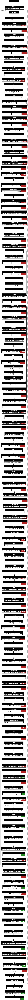

In [ ]:
# Load the model
model = tfk.models.load_model('weights.keras')

model.summary(expand_nested=True)

tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Predict labels for the test set
predictions = model.predict(X_test, verbose=0)

# Display the shape for the predictions
print(f'Predictions Shape: {predictions.shape}')

Predictions Shape: (1195, 8)


Accuracy score over the test set: 0.959
Precision score over the test set: 0.9594
Recall score over the test set: 0.959
F1 score over the test set: 0.9588


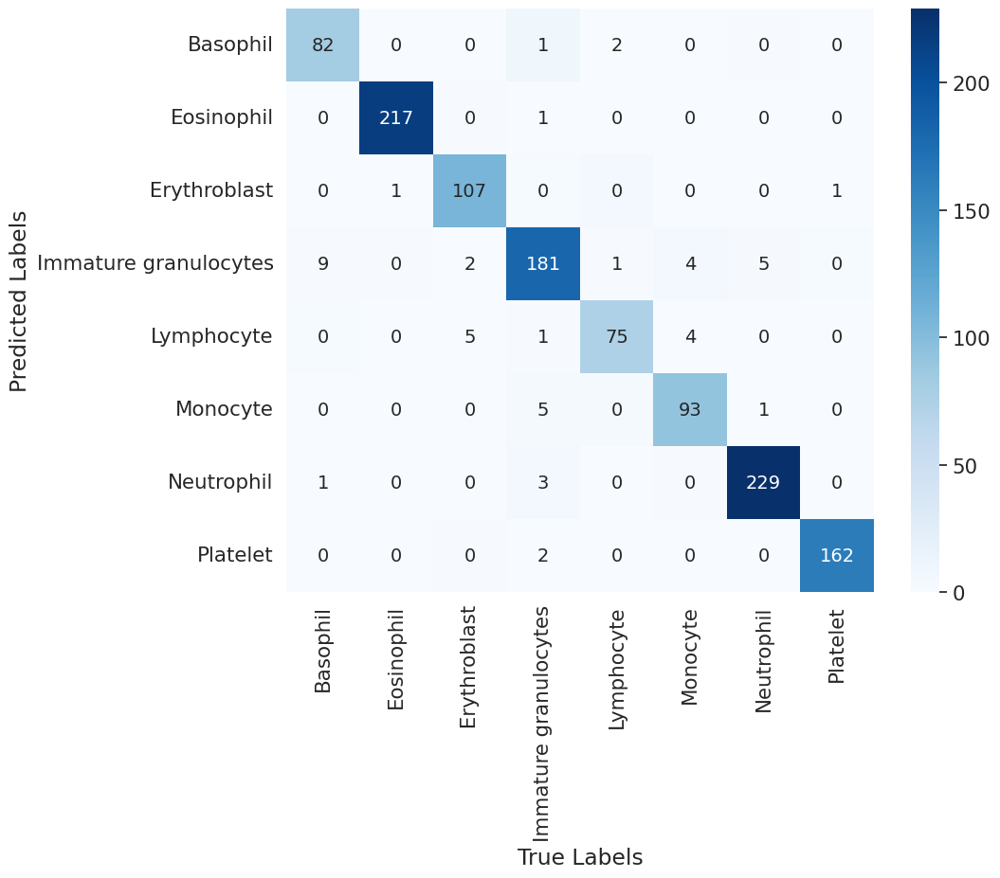

In [ ]:
# Convert predictions to class labels
pred_classes = np.argmax(predictions, axis=-1)

# Extract ground truth classes
true_classes = np.argmax(y_test, axis=-1)

# Compute and display test set accuracy
accuracy = accuracy_score(true_classes, pred_classes)
print(f'Accuracy score over the test set: {round(accuracy, 4)}')

# Compute and display test set precision
precision = precision_score(true_classes, pred_classes, average='weighted')
print(f'Precision score over the test set: {round(precision, 4)}')

# Compute and display test set recall
recall = recall_score(true_classes, pred_classes, average='weighted')
print(f'Recall score over the test set: {round(recall, 4)}')

# Compute and display test set
f1 = f1_score(true_classes, pred_classes, average='weighted')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# Combine numbers and percentages into a string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
plt.xlabel('True Labels')
plt.ylabel('Predicted Labels')
plt.show()

## 📊 Prepare Your Submission

To prepare your submission, create a `.zip` file that includes all the necessary code to run your model. It **must** include a `model.py` file with the following class:

```python
# file: model.py
class Model:
    def __init__(self):
        """Initialize the internal state of the model."""

    def predict(self, X):
        """Return a numpy array with the labels corresponding to the input X."""
```

The next cell shows an example implementation of the `model.py` file, which includes loading model weights from the `weights.keras` file and conducting predictions on provided input data. The `.zip` file is created and downloaded in the last notebook cell.

❗ Feel free to modify the method implementations to better fit your specific requirements, but please ensure that the class name and method interfaces remain unchanged.

In [ ]:
%%writefile model.py
import numpy as np

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl


class Model:
    def __init__(self):
        """
        Initialize the internal state of the model. Note that the __init__
        method cannot accept any arguments.

        The following is an example loading the weights of a pre-trained
        model.
        """
        self.neural_network = tfk.models.load_model('weights.keras')

    def predict(self, X):
        """
        Predict the labels corresponding to the input X. Note that X is a numpy
        array of shape (n_samples, 96, 96, 3) and the output should be a numpy
        array of shape (n_samples,). Therefore, outputs must no be one-hot
        encoded.

        The following is an example of a prediction from the pre-trained model
        loaded in the __init__ method.
        """
        preds = self.neural_network.predict(X)
        if len(preds.shape) == 2:
            preds = np.argmax(preds, axis=1)
        return preds

Overwriting model.py


In [ ]:
from datetime import datetime
filename = f'submission_{datetime.now().strftime("%y%m%d_%H%M%S")}.zip'

# Add files to the zip command if needed
!zip {filename} model.py weights.keras

from google.colab import files
files.download(filename)

  adding: model.py (deflated 56%)
  adding: weights.keras (deflated 10%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>